# Dog Vision (Dog Breed Identification)

End-to-End multi-class image classifier using Tensorflow 2.0 and Tensorflow Hub.

## Problem 

Identifying dog breed by their pictures 

## Data

Data from:
https://www.kaggle.com/c/dog-breed-identification/data?select=sample_submission.csv

## Evaluation

The evaluation is done by comparing the predictions to a test.csv file (with the real values)

## Features

Data consists of images, i.e., unstructured data (no dataframe - rows or columns), so it's probably best to use deep learning/transfer learning.



In [1]:
# Unzip data
# !unzip "/content/drive/MyDrive/Colab Notebooks/Dog_Vision_Project/dog-breed-identification.zip" -d "/content/drive/MyDrive/Colab Notebooks/Dog_Vision_Project/"

### Environment Preparation

In [2]:
# Import Tensorflow 2.0 into Colab (2.8.0)
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print('GPU', 'available (YES!)' if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.8.0
TF Hub version: 0.12.0
GPU available (YES!)


### Import data
With all machine learning formats, the data has to be in numerical format. So the first step is to turn the images into Tensors (numerical representations)

In [3]:
import pandas as pd
labels_csv = pd.read_csv('drive/MyDrive/Colab Notebooks/Dog_Vision_Project/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


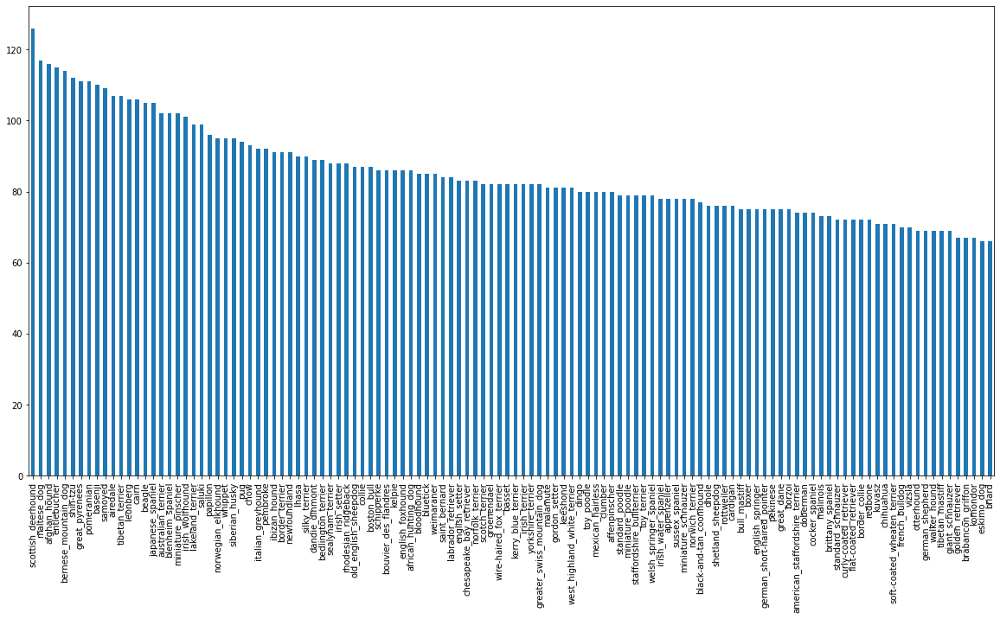

In [4]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10))

In [5]:
labels_csv['breed'].value_counts().mean()

85.18333333333334

In [6]:
labels_csv['breed'].value_counts().median()

82.0

In [7]:
# View image
from IPython.display import Image
Image('drive/MyDrive/Colab Notebooks/Dog_Vision_Project/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

In [8]:
# Create pathnames from images
filenames = ['drive/MyDrive/Colab Notebooks/Dog_Vision_Project/train/dogs/' + fname + '.jpg' for fname in labels_csv['id']]

filenames[:5]

['drive/MyDrive/Colab Notebooks/Dog_Vision_Project/train/dogs/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_Vision_Project/train/dogs/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_Vision_Project/train/dogs/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_Vision_Project/train/dogs/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_Vision_Project/train/dogs/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [9]:
# Check wether number of filenames matches number of actual image files
import os
if len(os.listdir('drive/MyDrive/Colab Notebooks/Dog_Vision_Project/train/dogs/')) == len(filenames):
  print('Filenames match actual amount of files. Proceed.')
else:
  print('Filenames do not match actual amount of files, check target directory.')

Filenames match actual amount of files. Proceed.


Label preparation

In [10]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [11]:
len(labels)

10222

In [12]:
# Check if number of labels matches number of filenames
if len(labels) == len(filenames):
  print('Number of labels matches number of filenames"')
else:
  print('Number of labels does not matche number of filenames, check data directories"')

Number of labels matches number of filenames"


In [13]:
# Unique breeds
unique_breeds = np.unique(labels_csv['breed'])
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [14]:
len(unique_breeds)

120

In [15]:
# Turn labels into boolean arrays
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [16]:
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # turn array into zeros and ones

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [17]:
print(labels[2]) 
print(boolean_labels[2].astype(int)) 

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating validation set (since Kaggle does not come with a validation set)

In [18]:
X = filenames
y = boolean_labels

Start experimenting with around ~1000 images and increase as needed

In [19]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [20]:
# Split into train and validation sets
from sklearn.model_selection import train_test_split

np.random.seed(42)

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [21]:
# X_val[:10]

In [22]:
# y_val[:10]

In [23]:
# validation_dir = '/content/drive/MyDrive/Colab Notebooks/Dog_Vision_Project/validation'

In [24]:
base_dir = 'drive/MyDrive/Colab Notebooks/Dog_Vision_Project'
train_dir = os.path.join(base_dir, 'train/dogs')
validation_dir = os.path.join(base_dir, 'validation/dogs')
train_fnames = os.listdir(train_dir)
print(train_dir)
print(validation_dir)

drive/MyDrive/Colab Notebooks/Dog_Vision_Project/train/dogs
drive/MyDrive/Colab Notebooks/Dog_Vision_Project/validation/dogs


In [25]:
picnames =[]
for item in X_val:
  picnames.append(item.rsplit('/train/dogs/', 1)[1])
picnames[:10]

['0ca9280205bd68d201e1d708db3f209d.jpg',
 '12405b2e93417d81f5308769c4e184c7.jpg',
 '1242da788ce85d4311e1cc9922a0a809.jpg',
 '1015e4eba660def32e7e52b89fe3a9c6.jpg',
 '09d5ac8026b8a7f7d1acae244765fe24.jpg',
 '1089c1e5058ffff12e1cca2e85205ed8.jpg',
 '0f5dd4999e44100d74f68c789f3edc54.jpg',
 '0c64a816fcd8aa13dbd4e874307bad51.jpg',
 '14e9a6d002632db71a18283fc024f086.jpg',
 '032c14b2df4193004913b01ab48f87c6.jpg']

In [26]:
# Copy validation images from train folder to validation folder
import shutil

for picname in picnames:
    src = os.path.join('drive/MyDrive/Colab Notebooks/Dog_Vision_Project/train/dogs/', picname)
    dst = os.path.join('drive/MyDrive/Colab Notebooks/Dog_Vision_Project/validation/dogs/', picname)
    shutil.copyfile(src, dst)

In [27]:
len(picnames)

200

## Preprocessing Images (turning images into Tensors)

To preprocess the images into Tensors a function is written that does a few things:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn the `image` (a jpg) into Tensors
4. Normalize `image` (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [28]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [29]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [30]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Preprocess funtion
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn the `image` (a jpg) into Tensors
4. Normalize `image` (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [31]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image filepath and turns it into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn jpeg image into numerical Tensor with 3 color channels (RGB - Red Green Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning data into batches

In [32]:
# Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path and associated label, processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [33]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it is training data but doesn't shuffle if it is validation data.
  Also accpets test data as input (no labels).
  """
  # If the data is a test dataset, there probably are not any labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, no need to shuffle
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # Training data
  else:
      print('Creating training data batches...')
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
      # Shuffle pathnames and labels before mapping image processor function is faster than shuffling images
      data = data.shuffle(buffer_size=len(X)) # shuffle before creating tuples for shorter time between experiments
      # Create (image, label) tuples (turns image path into a preprocessed image)
      data = data.map(get_image_label)
      # Turn the training data into batches
      data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [34]:
# Create training and validation batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [35]:
# Check the different attributes of the data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

In [36]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots ()
    ax = plt.subplot(5, 5, i+1)
    # Display image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')


In [37]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

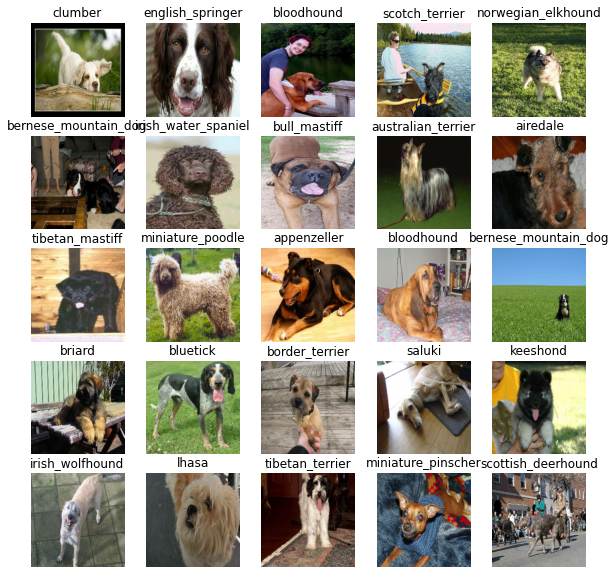

In [38]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

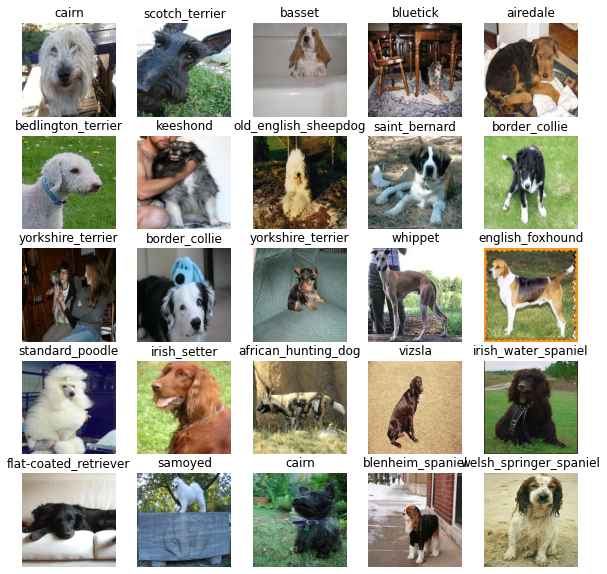

In [39]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Things to define before building a model:
* The input shape (images shape, in the form of Tensors) to the model
* The output shape (image labels in the form of Tensors) to the model
* The URL of the model to use

In [40]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
# MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v3_large_075_224/classification/5'



Keras deep learning model

* Takes the input shape, output shape and the model chosen as parameters
* Defines the layers in Keras model in sequential fashion
* Compiles the model (evaluation and improvement)
* Build the model
* Returns the model

In [41]:
from tensorflow.keras.layers import Dropout
from tensorflow.keras.regularizers import l2

In [42]:
# Create Keras model

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with', MODEL_URL)

  factor = 0.0001
  rate = 0.3

  # Setup the model layers
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL), # layer 1 (input layer)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                     kernel_regularizer=l2(factor),
                                                     activation='softmax'), # layer 2 (output layer)
                                                     Dropout(rate)
  ])

  # Compile model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build model
  model.build(INPUT_SHAPE)

  return model

In [43]:
model = create_model()
model.summary()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v3_large_075_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              4013897   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
 dropout (Dropout)           (None, 120)               0         
                                                                 
Total params: 4,134,137
Trainable params: 120,240
Non-trainable params: 4,013,897
_________________________________________________________________


## Creating callbacks

* TensorBoard callback (helps track models progress)
* Early stopping which prevents model from training for too long

### TensorBoard callback

In [44]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [45]:
import datetime

# Build TensorBoard callback
def create_tensorboard_callback():
  # Create log directory for storing TensorBoard logs
  logdir = os.path.join('drive/MyDrive/Colab Notebooks/Dog_Vision_Project/logs',
                        # Log time tracker
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps the model from overfitting by stopping training if a certain evaluation metric stops improving

In [46]:
# Early stop callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                   patience=3)

## Attempt to mitigate overfitting

### Exploring Data Augmentation
Let's get familiar with the concept of data augmentation, an essential way to fight overfitting for computer vision models.

In order to make the most of our few training examples, we will "augment" them via a number of random transformations, so that at training time, **our model will never see the exact same picture twice**. This helps prevent overfitting and helps the model generalize better.

This can be done by configuring a number of random transformations to be performed on the images read by our `ImageDataGenerator` instance. Let's get started with an example:



In [47]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

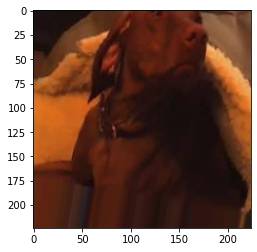

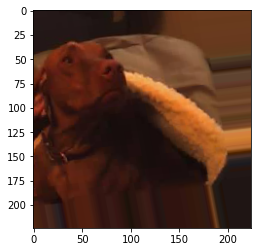

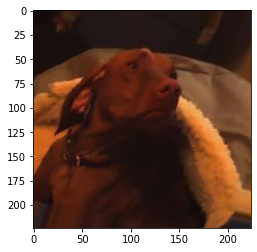

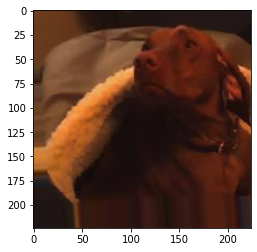

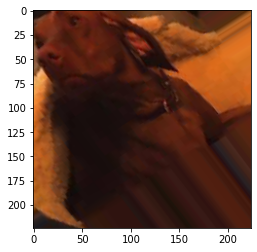

In [48]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from tensorflow.keras.preprocessing.image import array_to_img, img_to_array, load_img

img_path = os.path.join(train_dir, train_fnames[2])
img = load_img(img_path, target_size=(224, 224))  # this is a PIL image
x = img_to_array(img)  # Numpy array with shape (150, 150, 3)
x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 224, 224, 3)

# The .flow() command below generates batches of randomly transformed images
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
  plt.figure(i)
  imgplot = plt.imshow(array_to_img(batch[0]))
  i += 1
  if i % 5 == 0:
    break

## Add Data Augmentation to the Preprocessing Step

Now let's add our data-augmentation transformations from Exploring Data Augmentation to our data preprocessing configuration:

In [49]:
# Adding rescale, rotation_range, width_shift_range, height_shift_range,
# shear_range, zoom_range, and horizontal flip to our ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.6,
    height_shift_range=0.6,
    shear_range=0.6,
    zoom_range=0.6,
    horizontal_flip=True,)

# Note that the validation data should not be augmented!
val_datagen = ImageDataGenerator(rescale=1./255)

# Flow training images in batches of 32 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        '/content/drive/MyDrive/Colab Notebooks/Dog_Vision_Project/train',  # This is the source directory for training images
        target_size=(224, 224),  # All images will be resized to x
        batch_size=30,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

# Flow validation images in batches of 32 using val_datagen generator
validation_generator = val_datagen.flow_from_directory(
        '/content/drive/MyDrive/Colab Notebooks/Dog_Vision_Project/validation',
        target_size=(224, 224),
        batch_size=30,
        class_mode='binary')

Found 10222 images belonging to 1 classes.
Found 200 images belonging to 1 classes.


If we train a new network using this data augmentation configuration, our network will never see the same input twice. However the inputs that it sees are still heavily intercorrelated, so this might not be quite enough to completely get rid of overfitting.

## Training a Model (on a subset of data)

Start with 1000 images to make sure everything is working

In [50]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [51]:
# Check GPU
print('GPU', 'Available (YES!)' if tf.config.list_physical_devices('GPU') else 'Not available :(')

GPU Available (YES!)


In [52]:
# Train and return model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime a model is trained
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks 
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the model
  return model

In [53]:
# Fit model
model = train_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v3_large_075_224/classification/5
Epoch 1/100
25/25 [==============================] - 13s 219ms/step - loss: 8.5027 - accuracy: 0.0400 - val_loss: 4.1393 - val_accuracy: 0.1400
Epoch 2/100
25/25 [==============================] - 5s 189ms/step - loss: 6.3255 - accuracy: 0.4000 - val_loss: 2.9736 - val_accuracy: 0.3600
Epoch 3/100
25/25 [==============================] - 5s 206ms/step - loss: 5.6909 - accuracy: 0.5913 - val_loss: 2.4176 - val_accuracy: 0.4950
Epoch 4/100
25/25 [==============================] - 5s 208ms/step - loss: 5.1211 - accuracy: 0.6650 - val_loss: 2.1577 - val_accuracy: 0.5550
Epoch 5/100
25/25 [==============================] - 5s 206ms/step - loss: 5.2337 - accuracy: 0.6725 - val_loss: 2.0306 - val_accuracy: 0.5800
Epoch 6/100
25/25 [==============================] - 5s 204ms/step - loss: 4.7293 - accuracy: 0.7038 - val_loss: 1.9540 - val_accuracy: 0.6000
Epoch 7/100
25/25 [========================

**Question:** What are some ways to prevent models from overfitting in deep neural networks??

* Data Augmentation
* Regularization
* Early Stopping
* Dropout
* Change model 

## Checking the TensorBoard Logs

The TensorBoard magic function (`%tensorboard`) will acces the logs directory and visualize its contents

In [54]:
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/Dog_Vision_Project/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [55]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
print(predictions)
len(predictions)

7/7 [==============================] - 2s 159ms/step
[[1.85529795e-03 4.71635052e-04 1.20353216e-04 ... 7.80751754e-04
  1.96394321e-04 9.46925767e-03]
 [1.04497140e-03 1.57020614e-03 3.21412971e-03 ... 4.52551583e-04
  2.56573465e-02 1.09936646e-03]
 [1.86750886e-03 1.15510347e-05 1.51368862e-04 ... 1.22987032e-02
  1.45549129e-05 1.41021475e-04]
 ...
 [5.78662584e-05 1.30469925e-04 1.87000071e-04 ... 9.22135805e-05
  5.25004361e-05 1.27195774e-04]
 [1.26918789e-03 5.40863082e-04 3.98905140e-05 ... 1.07214946e-04
  3.11095500e-04 6.66219927e-03]
 [2.45091156e-04 1.56259761e-04 2.35582772e-03 ... 3.90183483e-03
  2.96153198e-03 1.11811724e-03]]


200

In [56]:
# First prediction
index=0
print(predictions[index])
print(f'Max value (probability of prediciton): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[1.85529795e-03 4.71635052e-04 1.20353216e-04 2.79950909e-04
 5.97037317e-04 5.12370956e-04 4.99681802e-03 4.31032293e-03
 9.33132693e-03 1.09969103e-03 2.65050191e-03 1.86194564e-04
 1.77719950e-04 4.87355283e-03 6.07747911e-03 2.90566636e-03
 6.12248041e-05 3.74850556e-02 7.25355349e-05 1.65992577e-04
 4.65544406e-04 2.37186486e-03 1.08217071e-04 7.37469494e-02
 1.69617633e-04 5.55719540e-04 3.55365574e-02 1.61421136e-03
 1.32924950e-04 8.16612563e-04 1.29813992e-03 5.17249107e-03
 5.76763507e-03 5.21513517e-04 2.05941222e-04 2.86937449e-02
 1.50668799e-04 1.32183859e-03 1.40684366e-04 6.03036257e-04
 8.39049811e-04 5.41075315e-05 2.82799099e-02 1.94017717e-04
 4.59269868e-05 4.36737464e-04 3.53293406e-04 7.01344630e-04
 8.74728523e-03 3.32924468e-03 2.77921907e-04 5.08581987e-04
 1.81897078e-02 2.66787480e-04 1.97455884e-05 2.78847147e-04
 5.16424479e-04 8.17408843e-04 7.37480703e-04 2.28972901e-02
 9.53660347e-04 1.31149500e-04 4.82785050e-03 4.90340346e-04
 7.94480555e-04 1.347408

**Note** Prediction probabilities are also known as confidence intervals

In [57]:
# Turn prediction probabilities into their respective label 
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

Convert batch data to unbatched data to make prediction on

In [58]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [59]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

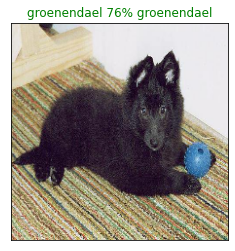

In [60]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer 
* Find the prediction using get_pred_label() 
* Find the top 10:
* Prediction probabilities indexes 
* Prediction probabilities values 
* Prediction labels 
* Plot the top 10 prediction probability values and labels, coloring the true label green 

In [61]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

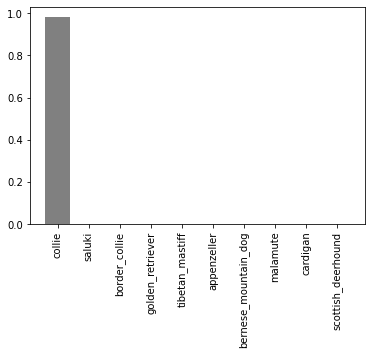

In [62]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

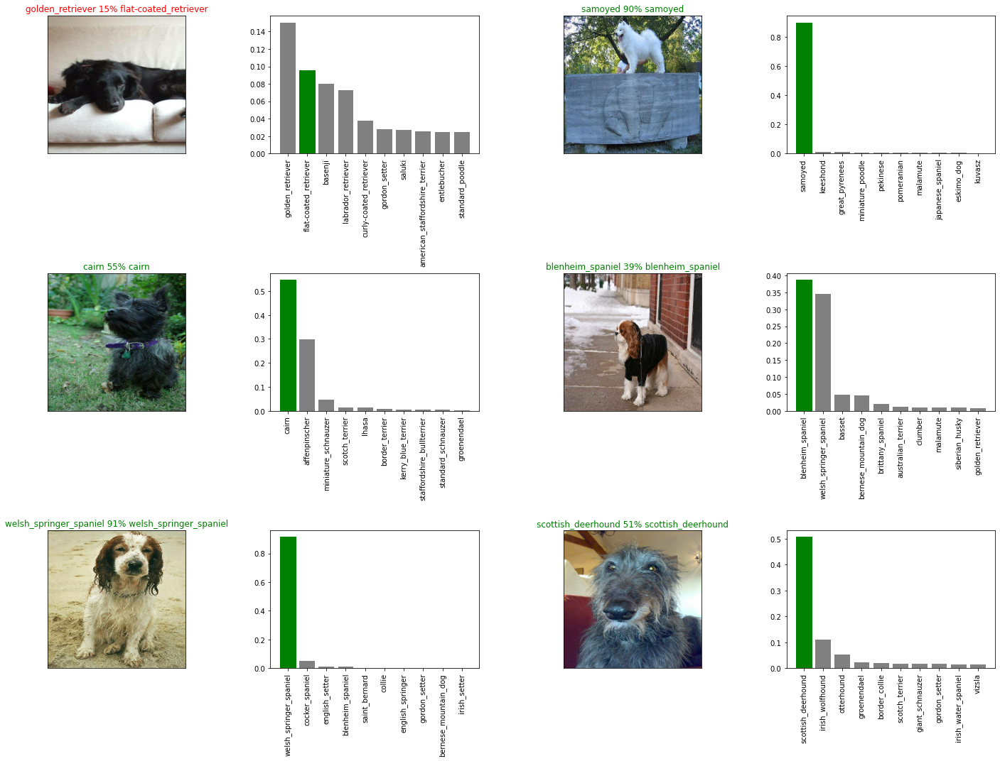

In [63]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

Challenge: How would you create a confusion matrix with our models predictions and true labels?

## Saving and reloading a trained model

In [64]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Colab Notebooks/Dog_Vision_Project/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [65]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [66]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv3-Adam")

Saving model to: drive/MyDrive/Colab Notebooks/Dog_Vision_Project/models/20220308-21421646775765-1000-images-mobilenetv3-Adam.h5...


'drive/MyDrive/Colab Notebooks/Dog_Vision_Project/models/20220308-21421646775765-1000-images-mobilenetv3-Adam.h5'

In [67]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Colab Notebooks/Dog_Vision_Project/models/20220308-21051646773541-1000-images-mobilenetv3-Adam.h5')

Loading saved model from: drive/MyDrive/Colab Notebooks/Dog_Vision_Project/models/20220308-21051646773541-1000-images-mobilenetv3-Adam.h5


In [68]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 123ms/step - loss: 1.6896 - accuracy: 0.6150


[1.6895710229873657, 0.6150000095367432]

## Training a big dog model 🐶 (on the full data)

In [69]:
len(X), len(y)

(10222, 10222)

In [70]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [71]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [72]:
# Create a model for full model
full_model = create_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v3_large_075_224/classification/5


In [73]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

Note: Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [74]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 58s 159ms/step - loss: 5.9065 - accuracy: 0.4390
Epoch 2/100
320/320 [==============================] - 52s 161ms/step - loss: 5.1726 - accuracy: 0.6011
Epoch 3/100
320/320 [==============================] - 52s 164ms/step - loss: 5.1638 - accuracy: 0.6319
Epoch 4/100
320/320 [==============================] - 53s 164ms/step - loss: 5.0807 - accuracy: 0.6525
Epoch 5/100
320/320 [==============================] - 52s 163ms/step - loss: 4.9771 - accuracy: 0.6682
Epoch 6/100
320/320 [==============================] - 52s 163ms/step - loss: 5.0264 - accuracy: 0.6713
Epoch 7/100
320/320 [==============================] - 53s 164ms/step - loss: 4.9181 - accuracy: 0.6833
Epoch 8/100
320/320 [==============================] - 52s 164ms/step - loss: 4.9158 - accuracy: 0.6882
Epoch 9/100
320/320 [==============================] - 52s 163ms/step - loss: 4.8942 - accuracy: 0.6894
Epoch 10/100
320/320 [==============================] - 52s 163m

In [75]:
save_model(full_model, suffix="full-image-set-mobilenetv3-Adam")

Saving model to: drive/MyDrive/Colab Notebooks/Dog_Vision_Project/models/20220308-22041646777056-full-image-set-mobilenetv3-Adam.h5...


'drive/MyDrive/Colab Notebooks/Dog_Vision_Project/models/20220308-22041646777056-full-image-set-mobilenetv3-Adam.h5'

In [76]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Colab Notebooks/Dog_Vision_Project/models/20220308-21051646773541-1000-images-mobilenetv3-Adam.h5')

Loading saved model from: drive/MyDrive/Colab Notebooks/Dog_Vision_Project/models/20220308-21051646773541-1000-images-mobilenetv3-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

Get the test image filenames. ✅
Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels). ✅
Make a predictions array by passing the test batches to the predict() method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Colab Notebooks/Dog_Vision_Project/test/dogs/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

In [ ]:
len(test_filenames)

In [79]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [80]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

Note: Calling predict() on our full model and passing it the test data batch will take a long time to run (about a ~1hr). This is because we have to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [81]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 74s 224ms/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Colab Notebooks/Dog_Vision_Project/preds_array2.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Colab Notebooks/Dog_Vision_Project/preds_array2.csv", delimiter=",")

In [ ]:
test_predictions[:10]

In [ ]:
test_predictions.shape

## Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
Add data to the ID column by extracting the test image ID's from their filepaths.
Add data (the prediction probabilites) to each of the dog breed columns.
Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
["id"] + list(unique_breeds)

In [87]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [88]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [89]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e43f6e621469f438f351d31d889b839f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,df0196ea5d16d1570c1f2b567b975b90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e757a7450559dc61a9261fe978e23b04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e246de79e4efd1145698d9c21466bbaf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dcdaf98ba8979ac0373d6dce63872053,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [90]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e43f6e621469f438f351d31d889b839f,0.000016,0.000062,0.000185,0.000003,0.000040,0.000011,0.000038,0.000019,0.957971,...,0.000228,0.000063,0.000040,0.000101,0.000210,0.001668,0.000038,0.000042,0.000103,0.000012
1,df0196ea5d16d1570c1f2b567b975b90,0.000304,0.000706,0.001028,0.002479,0.002369,0.002583,0.000651,0.001327,0.000873,...,0.000028,0.005839,0.083848,0.000265,0.011751,0.000586,0.000102,0.007414,0.001000,0.003591
2,e757a7450559dc61a9261fe978e23b04,0.000614,0.000554,0.124377,0.000131,0.000861,0.001126,0.000089,0.001286,0.000091,...,0.000986,0.000161,0.013150,0.000450,0.000326,0.001820,0.000546,0.002217,0.000316,0.000170
3,e246de79e4efd1145698d9c21466bbaf,0.010084,0.017308,0.000218,0.000398,0.012232,0.004768,0.000311,0.004665,0.004180,...,0.023610,0.005125,0.000265,0.002626,0.000147,0.064253,0.007374,0.003516,0.001510,0.004854
4,dcdaf98ba8979ac0373d6dce63872053,0.003562,0.002264,0.000223,0.002036,0.040399,0.004691,0.003820,0.038405,0.000623,...,0.006248,0.012519,0.007355,0.012065,0.003954,0.000194,0.002893,0.083185,0.000285,0.000747


In [91]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Colab Notebooks/Dog_Vision_Project/full_model_predictions_submission_1_mobilenetV3.csv",
                index=False)

## Making predictions on custom images
To make predictions on custom images, we'll:

Get the filepaths of our own images.
Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
Pass the custom image data batch to our model's predict() method.
Convert the prediction output probabilities to predictions labels.
Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Colab Notebooks/Dog_Vision_Project/my_dog_photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

[]

In [92]:
# Turn custom images into batch datasets 
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [93]:
custom_preds.shape

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

In [94]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)